# CS5487 Programming Assignment 2

LE Trung Hai - 57072995

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import multivariate_normal as gaussian
from PIL import Image

sns.set_theme(rc={
    "figure.dpi": 150,
    "figure.figsize": (16, 6),
})

In [2]:
def read_input(file_path, atleast_2d=False):
    data = np.loadtxt(file_path)
    # by default a row of numbers in loaded as a 1D vector
    if atleast_2d:
        if data.ndim == 1:
            data = data.reshape((1, -1))
    return data.T

In [3]:
data_path = "PA2-cluster-data/cluster_data_text/cluster_data_data"
X_A = read_input(f"{data_path}A_X.txt")
y_A = read_input(f"{data_path}A_Y.txt")
X_B = read_input(f"{data_path}B_X.txt")
y_B = read_input(f"{data_path}B_Y.txt")
X_C = read_input(f"{data_path}C_X.txt")
y_C = read_input(f"{data_path}C_Y.txt")

## Part 1: Clustering synthetic data

For this part, we first define a base class for all of the clustering models. Similar to before, we adopt an API inspired by scikit-learn, with basically 2 methods: `fit` for training the model, and `predict` for using the model.

In [4]:
class Cluster:
    def __init__(self):
        self.labels = None
        self.cluster_centers = None

    def fit(self, X):
        pass

### 1(a) Implement 3 clustering algorithms

We use 3 classes, inheriting the `Cluster` parent class. Each class implements its own `fit(X)` method for clustering the dataset $X$, which should have shape `(n_samples, n_features)`. Since $k$-means and EM require initialization, we first create a wrapper class to provide two center initialization methods: random picking and furthest first.

In [5]:
class CenterInit:
    def __new__(cls, method):
        if method == "random":
            return CenterInit.random
        elif method == "furthest first":
            return CenterInit.furthest_first
        else:
            return CenterInit.random

    def random(X, n_clusters, seed=0):
        rng = np.random.default_rng(seed)
        centers = rng.choice(X, size=n_clusters, axis=0, replace=False)
        return centers

    def furthest_first(X, n_clusters, seed=0):
        pairwise_dists = np.linalg.norm(X[:, np.newaxis] - X, axis=2)
        center_indices = np.unravel_index(np.argmax(pairwise_dists), pairwise_dists.shape)
        centers = X[center_indices, :]
        for _ in range(2, n_clusters):
            other_indices = np.full(X.shape[0], True)
            other_indices[list(center_indices)] = 0
            total_dists_to_centers = np.apply_along_axis(
                lambda sample: np.linalg.norm(sample - centers, axis=1).sum(),
                axis=1,
                arr=X[other_indices, :]
            )
            center_indices += (np.argmax(total_dists_to_centers),)
            centers = X[center_indices, :]
        return centers

#### $k$-means

We now return to the clustering algorithm. First is $k$-means. The code is hopefully self-explanatory.

In [6]:
class KMeans(Cluster):
    def __init__(self, n_clusters, max_iter=500, tol=1e-5, init=CenterInit("random"), seed=0):
        super().__init__()
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.tol = tol
        self.init = init
        self.seed = seed

    def fit(self, X):
        n, d = X.shape
        k = self.n_clusters
        # Cluster assignments: z_{ij} = 1 if x_i in cluster j, 0 otherwise. Shape=(n, k).
        Z = np.zeros((n, k))
        # Cluster centers. Shape=(k, d).
        self.cluster_centers = self.init(X, k, self.seed)
        # Training data in suitable shape. Shape=(n, d, k).
        Xs = np.repeat(X[..., np.newaxis], self.n_clusters, axis=-1)
        # Cluster centers of current iteration in suitable shape. Shape=(n, d, k).
        us = np.repeat(self.cluster_centers[..., np.newaxis].T, X.shape[0], axis=0)
        # Cluster centers of previous iteration. Shape=(n, d, k).
        prev_us = None

        for i in range(self.max_iter):
            # Distance from each point to each cluster center. Shape=(n, k).
            distances = np.linalg.norm(Xs - us, axis=1)
            # Closest cluster to each point. Shape=(n,).
            assignments = np.argmin(distances, axis=1)
            Z = np.identity(k)[assignments]
            self.cluster_centers = Z.T @ X / Z.T.sum(axis=1, keepdims=True)
            us = np.repeat(self.cluster_centers[..., np.newaxis].T, X.shape[0], axis=0)

            if prev_us is not None and np.linalg.norm(us - prev_us) < self.tol:
                break
            prev_us = us

        self.n_iter = i + 1
        self.cluster_centers = self.cluster_centers
        self.labels = assignments
        return self

#### EM for GMM

Next is EM for GMM. In the M-step, to update the model covariance quickly, we can use Einstein summation notation: the `j`th covariance turns out to be `np.einsum("n,na,nb->ab", Z[:, j], X-mu[j], X-mu[j]) / N[j]`

In [7]:
class GMM_EM(Cluster):
    def __init__(self, n_clusters, max_iter=500, tol=1e-5, init=CenterInit("random"), seed=0):
        super().__init__()
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.tol = tol
        self.init = init
        self.seed = seed
    
    def fit(self, X):
        n, d = X.shape
        k = self.n_clusters
        # Cluster weights (i.e., class probabilities). Shape=(k,).
        pi = np.full(k, 1/k)
        # Cluster centers. Shape=(k, d).
        mu = self.init(X, k, self.seed)
        # Cluster covariances. Shape=(k, d, d).
        Sigma = np.repeat(np.identity(d)[np.newaxis, ...], k, axis=0)
        # Cluster centers of previous iteration. Shape=(k, d).
        prev_mu = None
        
        for i in range(self.max_iter):
            # E-STEP
            # Class-conditional densities: entry_ij = p(x_i | mu_j, Sigma_j)
            # Shape=(n, k).
            conditional_probs = np.array([
                [gaussian.pdf(x, mean=m, cov=S) for (m, S) in zip(mu, Sigma)]
                for x in X
            ])
            # Posterior probabilites: Z_{ij} = p(z_i = j | x_i). Shape=(n, k).
            Z = conditional_probs * pi
            Z = Z / np.sum(Z, axis=1, keepdims=True)

            # M-STEP
            # Shape=(k,). 
            N = np.sum(Z, axis=0)
            pi = N / X.shape[0]
            mu = Z.T @ X / N[:, np.newaxis]
            # Shape of each "row": (n,), (n, d), (n, d) -> (d, d)
            Sigma = np.array([
                np.einsum("n,na,nb->ab", Z[:, j], X-mu[j], X-mu[j]) / N[j]
                for j in range(k)
            ])
            
            if prev_mu is not None and np.linalg.norm(prev_mu - mu) < self.tol:
                break
            prev_mu = mu
        
        self.n_iter = i + 1
        self.cluster_centers = mu
        self.labels = np.argmax(Z, axis=1)
        return self

#### Mean shift

In [8]:
class MeanShift(Cluster):
    def __init__(self, bandwidth, max_iter=500, tol=1e-5, seed=0):
        super().__init__()
        self.bandwidth = bandwidth
        self.max_iter = max_iter
        self.tol = tol
        self.seed = seed
    
    def fit(self, X):
        h = self.bandwidth
        prev_Xt = np.copy(X)
        Xt = None
        for i in range(self.max_iter):
            Xt = np.apply_along_axis(
                lambda m: np.average(X, axis=0, weights=gaussian.pdf(X, mean=m, cov=h**2)),
                axis=1,
                arr=prev_Xt
            )

            if np.linalg.norm(prev_Xt - Xt) < self.tol:
                break
            prev_Xt = Xt
            Xt = None

        self.n_iter = i + 1
        # After iteration, each point converges to a cluster center. However, due to
        # floats inaccuracy, the centers might not be exactly equal. Here, we allow
        # equality if each feature of the centers match up to 6 decimal points.
        decimal = 6
        Xt = prev_Xt if Xt is None else Xt
        self.cluster_centers, self.labels = np.unique(np.round(Xt, decimal), return_inverse=True, axis=0)
        return self

### 1(b) Clustering performance

First we need a helper to fit and plot the result of a given model.

In [9]:
def fit_plot(model):
    datasets = [(X_A, y_A), (X_B, y_B), (X_C, y_C)]
    titles = ["dataA", "dataB", "dataC"]
    _, axs = plt.subplots(1, 3, sharey=True, constrained_layout=True)

    for i, ax in enumerate(axs):
        X = datasets[i][0]
        
        mo = model.fit(X)
        centers = mo.cluster_centers
        labels = mo.labels.astype(int)

        n, d = X.shape
        k = centers.shape[0]
        X_and_centers = np.vstack((X, centers))
        df = pd.DataFrame({
            "x_1": X_and_centers[:, 0],
            "x_2": X_and_centers[:, 1],
            "cluster": np.append(labels, np.arange(k)),
            "style": np.append(np.zeros(n), np.ones(k))
        })
        sns.scatterplot(data=df, x="x_1", y="x_2", hue="cluster", palette="Set2", style="style", ax=ax)
        legend_handles, legend_labels = ax.get_legend_handles_labels()
        ax.legend(legend_handles[:-3], legend_labels[:-3]) # remove unnecessary legend
        ax.set_xlabel("$x_1$")
        ax.set_ylabel("$x_2$")
        ax.set_title(titles[i])

#### $k$-means

First, we have $k$-means with 4 clusters (assumed a priori) and random initialization (default). We can see that $k$-means does not perform well, especially in `dataB`: each of the four clusters contains two visibly separated stripes of points. The result for `dataC` is also underwhelming, with a part of the orange cluster invading the pink cluster on the right for no reasons. The result for `dataA` looks the best: $k$-means seems to work best when cluster are fairly spherical or "blob"-like.

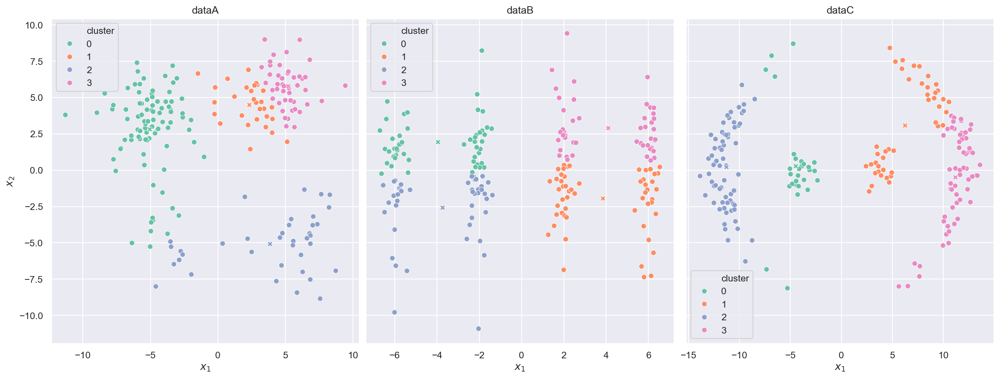

In [10]:
fit_plot(KMeans(n_clusters=4))

Changing the seed and thus the initial centroids makes the result vary wildly. For example, here, with a seed of 52, $k$-means performs excellently for `dataA` and to a lesser extent for `dataC`, while the `dataB` result is quite improved too, with 2 clusters correctly identified.

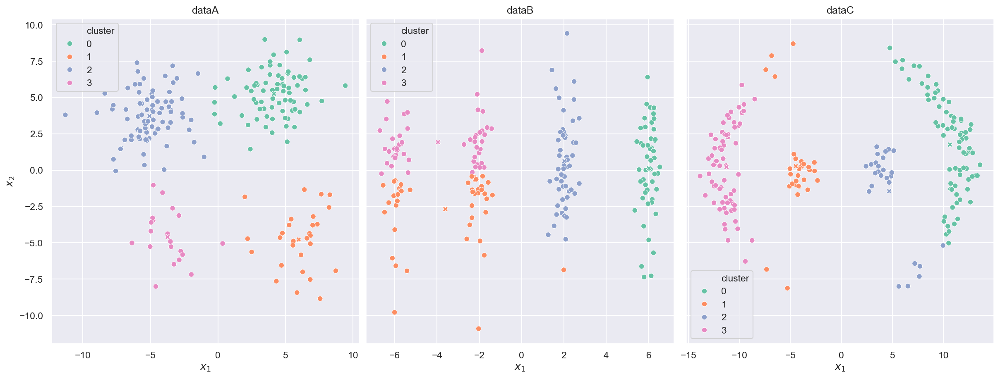

In [11]:
fit_plot(KMeans(n_clusters=4, max_iter=1000, tol=1e-6, seed=52))

#### EM for GMM

Moving onto EM for GMM, which performs better and more consistent than $k$-means in both `dataA` and `dataB`. However, it struggles with `dataC`, often splitting the an arc of points into two separate clusters. It seems the kind of enwrapping clusters like `dataC` do not fit well into the model of Gaussian mixture.

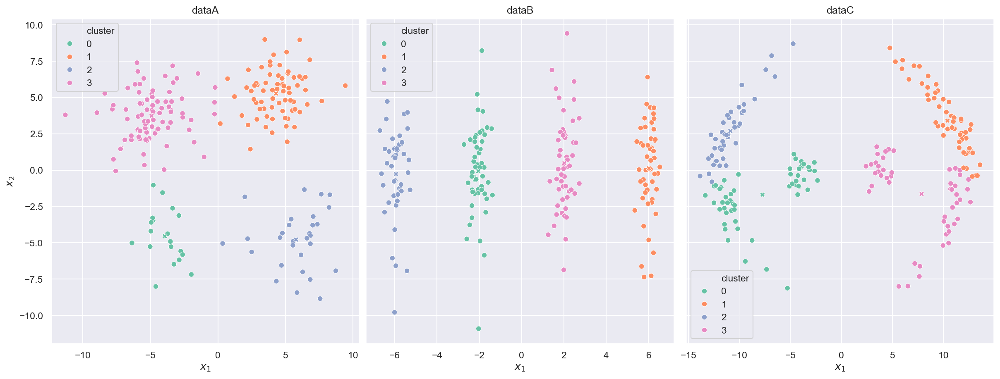

In [12]:
fit_plot(GMM_EM(n_clusters=4, seed=24))

We can also experiment with a different initialization algorithm: the "furthest first" initialization procedure, as described in the problem document. Note that "furthest first" is deterministic given the training data, so setting the seed of the model does not have an effect. Using this initialization scheme, it seems $k$-means is somewhat better on `dataB`, though not by much, and EM on GMM mostly stays the same.

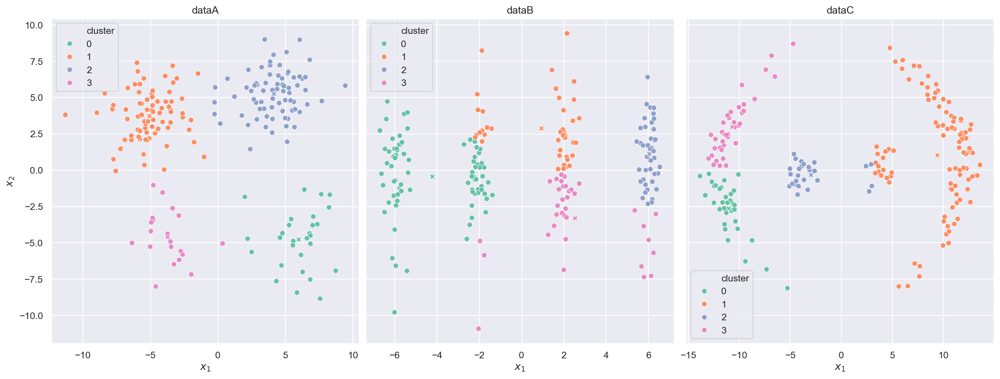

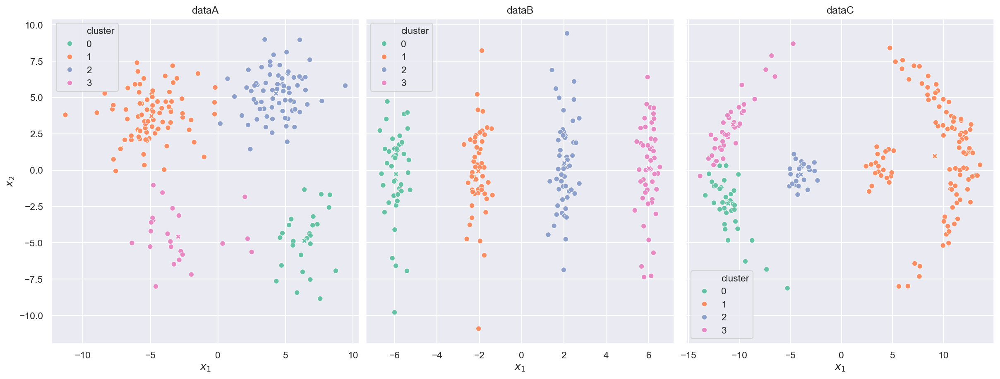

In [13]:
fit_plot(KMeans(n_clusters=4, init=CenterInit("furthest first")))
fit_plot(GMM_EM(n_clusters=4, init=CenterInit("furthest first")))

#### Mean shift

Finally, MeanShift performs well across all three datasets with bandwidth $h=1.6$. Though it identifies one extra cluster for `dataB` and `dataC`, it is understandable as those are somewhat outliers. The advantage of not needing to specify the number of clusters is quite great, and it seems like the Gaussian kernel can handle these datasets well.

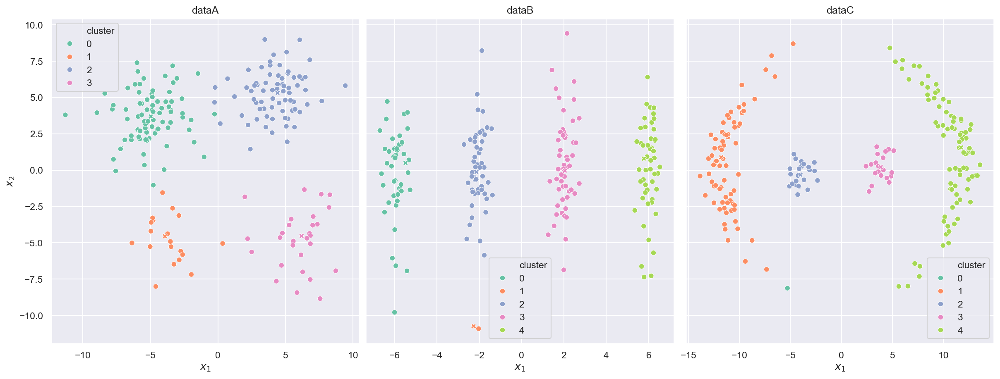

In [14]:
fit_plot(MeanShift(bandwidth=1.6, max_iter=500, tol=1e-7))

### 1(c) Mean shift bandwidth

Trying out different values for bandwidth, we see that mean shift depends on this value $h$ to identify clusters correctly. Setting $h$ too large would lump nearby clusters together, and setting it too small would make mean shift produce many more clusters than necessary, as can be seen below. With $h=2$, the algorithm identifies only 2 clusters in `dataB`. With $h=1$, it generates up to 8 or 9 clusters, with some clusters consisting of only one point.

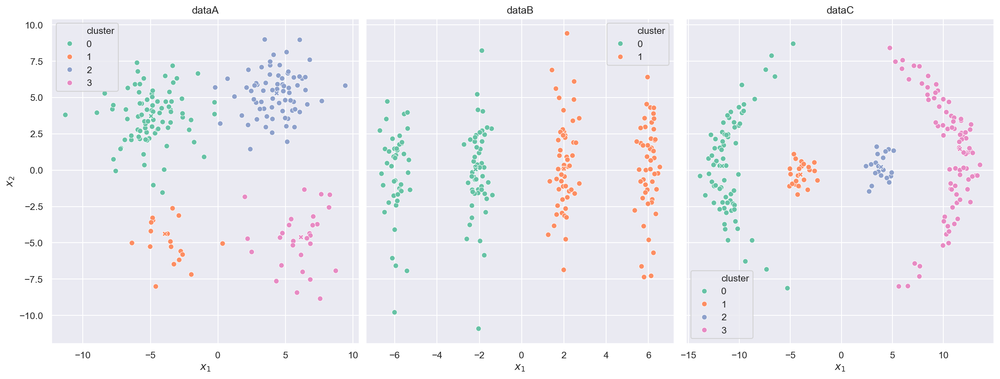

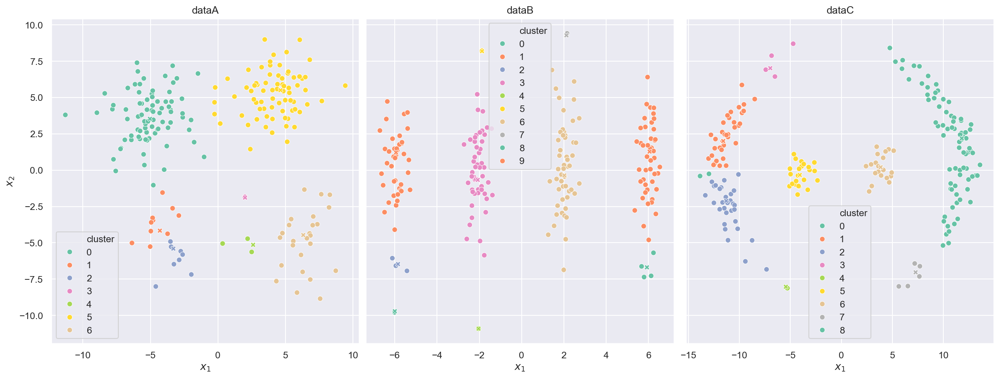

In [15]:
fit_plot(MeanShift(bandwidth=2, tol=1e-7))
fit_plot(MeanShift(bandwidth=1, tol=1e-7))

## Part 2: Image segmentation

### 2(a) Naive segmentation

In [16]:
from python_helpers import pa2

def segment_img(model, img_name):
    _, axs = plt.subplots(1, 3)

    img = Image.open(f"./PA2-cluster-images/images/{img_name}")
    axs[0].imshow(img)
    axs[0].grid(False)

    X, L = pa2.getfeatures(img, 7)
    X = X / np.max(X) * 15
    model.fit(X.T)

    segm = pa2.labels2seg(model.labels + 1, L)
    axs[1].imshow(segm)
    axs[1].grid(False)

    color_segm = pa2.colorsegms(segm, img)
    axs[2].imshow(color_segm)
    axs[2].grid(False)

#### $k$-means

We follow the MATLAB example code given in the problem statement and set the number of clusters to 2. Unfortunately, $k$-means produces a completely useless clustering for some reasons. Setting $k$ to 4 or any different values, changing the initialization scheme, and raising the iteration count do not help at all. The algorithm simply splits the image into $k$ roughly even parts, indicating the location features in the data might have influenced the entire clustering process somehow.

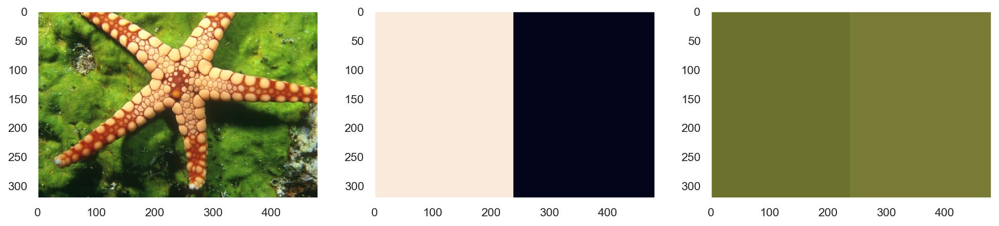

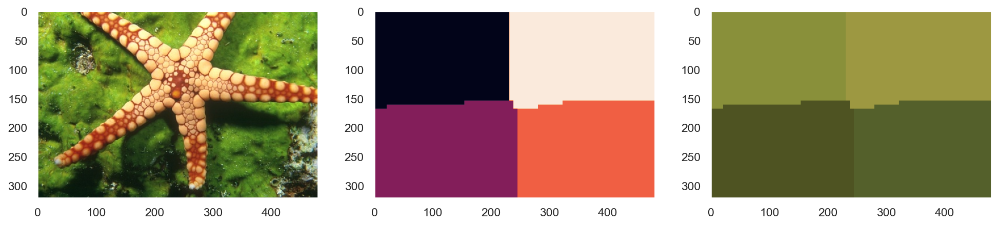

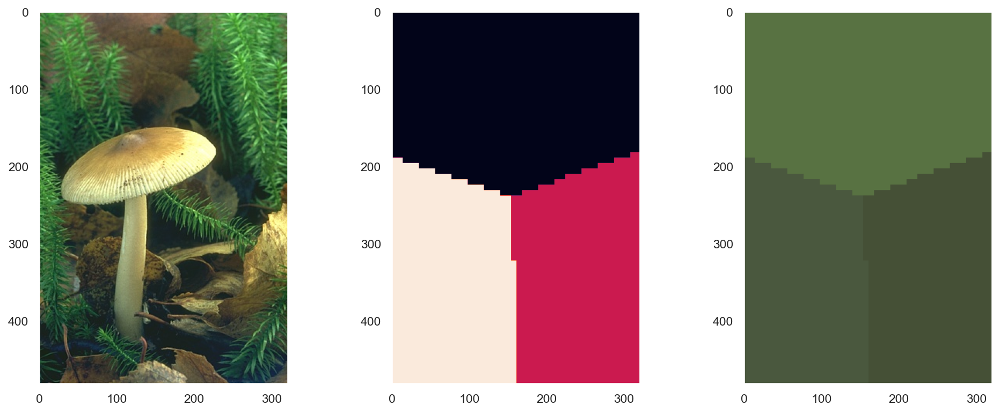

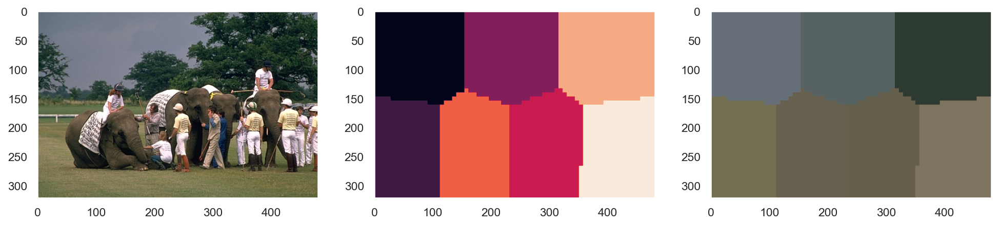

In [17]:
segment_img(KMeans(n_clusters=2), "12003.jpg")
segment_img(KMeans(n_clusters=4), "12003.jpg")
segment_img(KMeans(n_clusters=3, init=CenterInit("furthest first")), "208001.jpg")
segment_img(KMeans(n_clusters=7, max_iter=800), "361084.jpg")

#### EM for GMM

We have a problem with doing segmentation on the data as-is with EM: the data range is quite large, so the norm $\lVert x-\mu \rVert$ is on the order of hundreds, making all Gaussian densities collapse to zero, as $\exp\left(-\frac{1}{2}\lVert x-\mu \rVert^2\right)$ becomes infinitesimal. We employ a simple fix by scaling the entire dataset such that the maximum value of the entire feature set is around, say, 10 or 20, to avoid catastrophic vanishing. The result for the starfish image is quite good, as can be seen below. Other images get more mixed quality, but the final segmentation is still quite clear. For more complex images, increasing $k$ (and the iteration limit) improves the segmentation result noticeably.

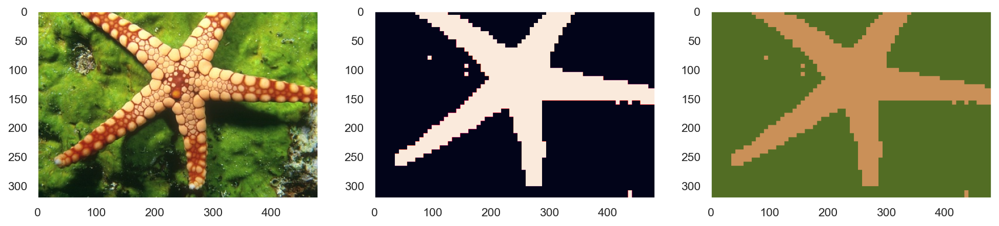

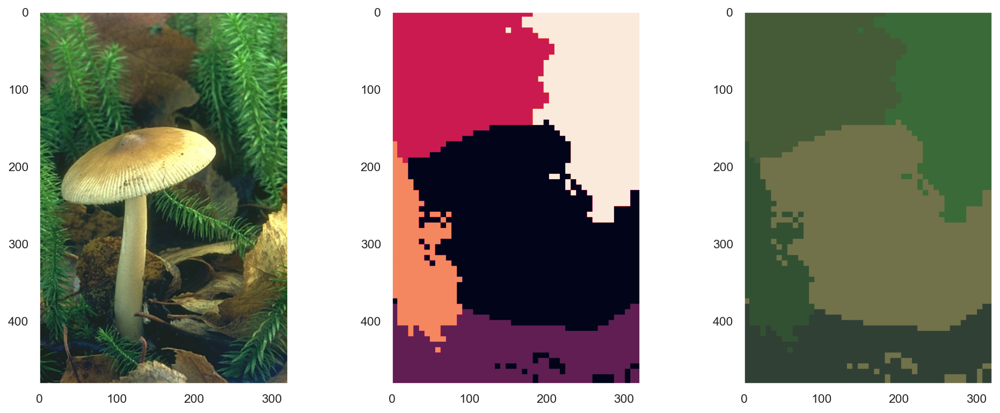

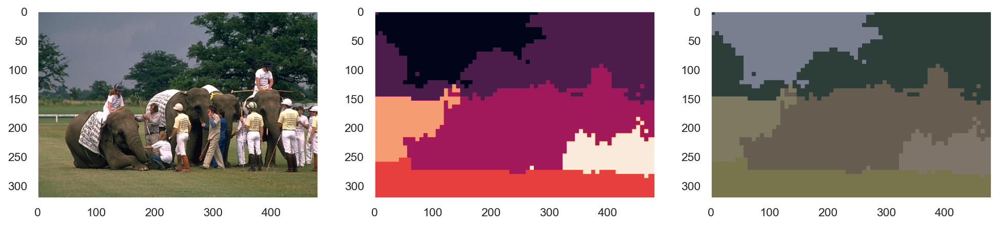

In [18]:
segment_img(GMM_EM(n_clusters=2), "12003.jpg")
segment_img(GMM_EM(n_clusters=5, max_iter=800), "208001.jpg")
segment_img(GMM_EM(n_clusters=6, max_iter=800), "361084.jpg")

#### Mean shift

As with EM, we scale the features so that the maximum value among the entire dataset is 15, since mean shift also uses the Gaussian kernel. The results are fantastic: the amazing nuances in details and color blocks captured are on a different level from the previous two methods, almost like an image captured from an infrared camera. The biggest drawback of mean shift (and EM, to a lesser extent) is that it is very slow: segmenting these three images takes nearly 8 minutes, compared to 2 seconds with $k$-means; the quality tradeoff might, however, be worth it.

With the features scaling done, the ideal bandwidth seems to be the smaller the better and the more fine-grained the segmentation will be. Using $h=5$ on the starfish produces some nonsensical results; with $h=0.5$, the outcome is remarkable. Especially impressive is with $h=0.1$ on the image "361084.jpg", which features a complex scene with multiple subjects, and yet mean shift is able to distinguish them to a surprising level of accuracy.

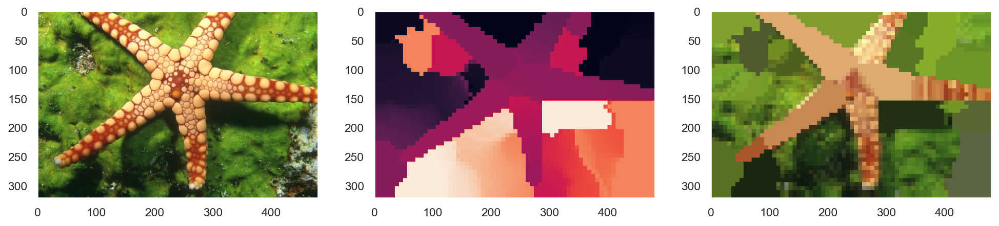

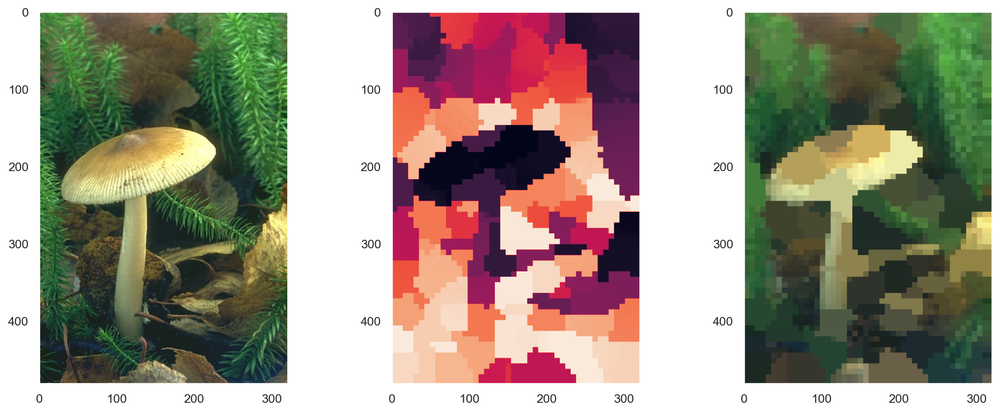

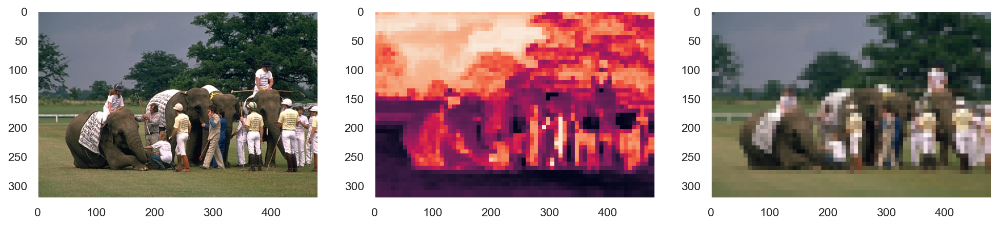

In [19]:
segment_img(MeanShift(bandwidth=0.5), "12003.jpg")
segment_img(MeanShift(bandwidth=0.25), "208001.jpg")
segment_img(MeanShift(bandwidth=0.1), "361084.jpg")

### 2(b) Non-uniform feature scaling

Instead of modifying the code of $k$-means and mean shift directly, we can instead scale each feature differently and achieve the same goal.

In [20]:
class KMeansNonIsotropic(KMeans):
    def __init__(self, scale, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.scale = scale
    
    def fit(self, X):
        return super().fit(X * self.scale.reshape((1, -1)))

class MeanShiftNonIsotropic(MeanShift):
    def __init__(self, scale, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.scale = scale
    
    def fit(self, X):
        return super().fit(X * self.scale.reshape((1, -1)))

For $k$-means, scaling the features vastly improves the segmentation results. The location features seem to actually have dominated the chrominance value, so by making those two components smaller (using the scaling array `[1, 1, 0.04, 0.04]`), we make the data more isotropic. Interestingly, that means the model is now capable of clustering points that are not near each other on the image, as can be seen in the third row, with blocks of black and red separated and not contiguous.

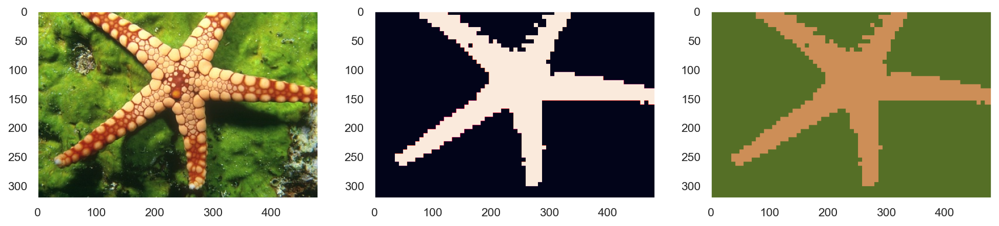

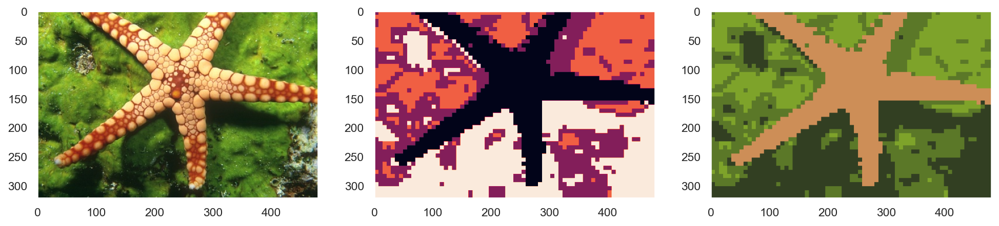

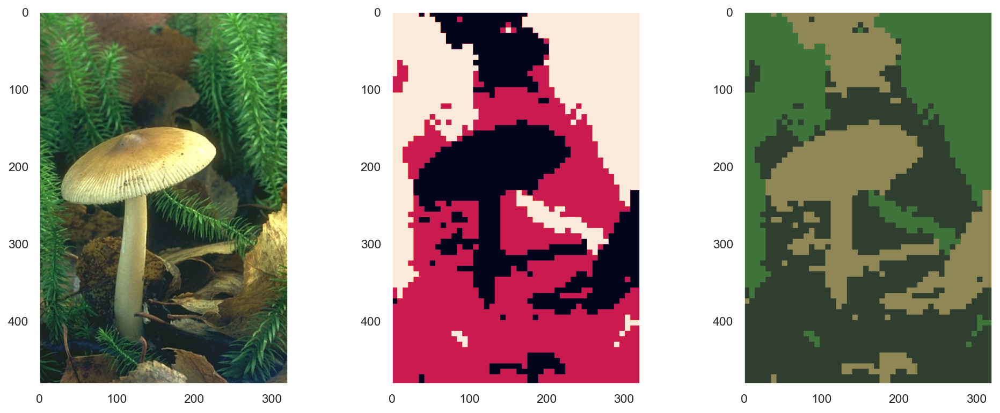

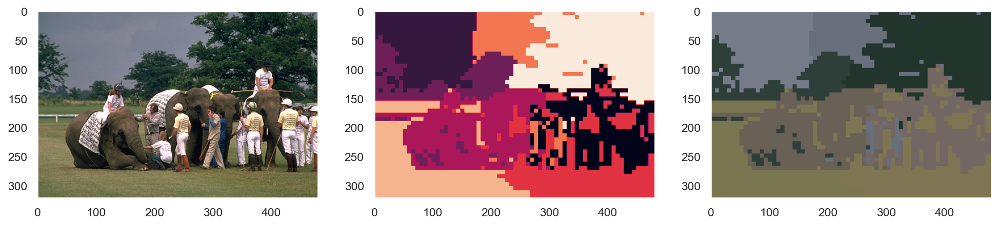

In [21]:
scale = np.array([1, 1 , 0.04, 0.04])
segment_img(KMeansNonIsotropic(n_clusters=2, scale=scale), "12003.jpg")
segment_img(KMeansNonIsotropic(n_clusters=4, scale=scale), "12003.jpg")
segment_img(KMeansNonIsotropic(n_clusters=3, scale=scale, init=CenterInit("furthest first"), max_iter=1000), "208001.jpg")
segment_img(KMeansNonIsotropic(n_clusters=8, scale=scale, max_iter=1000, tol=1e-7), "361084.jpg")

Using the same scaling array actually makes the results much worse for mean shift. The original mean shift without scaling already perform quite well, which indicates mean shift is less prone to anisotropy than $k$-means perhaps we need less adjustments here. Experimenting with the scaling array `[1, 1, 0.2, 0.2]`, `[1, 1, 0.5, 0.5]`, and others all lead to somewhat inferior results.

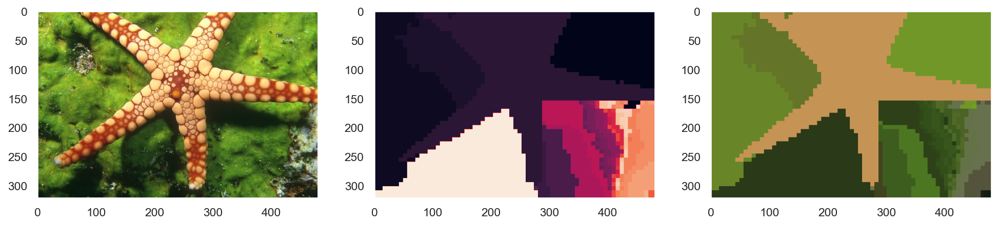

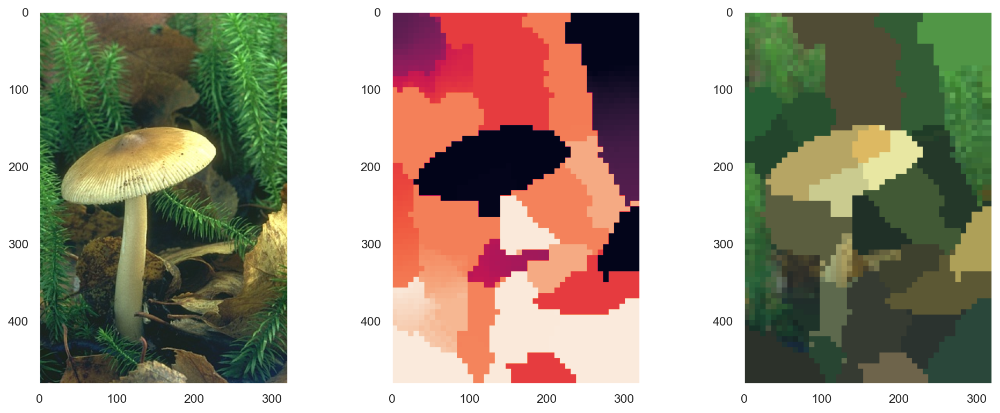

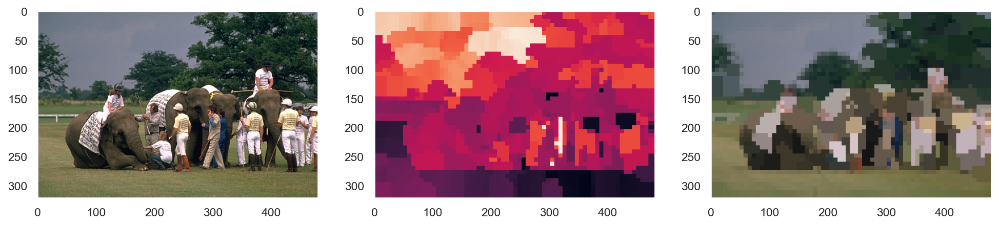

In [22]:
scale_2 = np.array([1, 1, 0.5, 0.5])
segment_img(MeanShiftNonIsotropic(bandwidth=0.5, scale=scale_2), "12003.jpg")
segment_img(MeanShiftNonIsotropic(bandwidth=0.25, scale=scale_2), "208001.jpg")
segment_img(MeanShiftNonIsotropic(bandwidth=0.1, scale=scale_2), "361084.jpg")